In [ ]:
!pip install -q git+https://github.com/tensorflow/docs 

     |████████████████████████████████| 1.0MB 9.2MB/s 


In [ ]:
pip install mtcnn

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import os
import PIL
import random
import imageio
from numpy import asarray
from PIL import Image
from tensorflow import keras
from glob import glob
from tensorflow.keras import layers

In [ ]:
(x_train, _), (x_test, _) = tf.keras.datasets.mnist.load_data()

11493376/11490434 [==============================] - 0s 0us/step


In [ ]:
x_train.shape

(60000, 28, 28)

In [ ]:
batch_size = 128

all_digits = np.concatenate([x_train, x_test])
all_digits = np.reshape(all_digits, (-1,28,28,1))
all_digits = (all_digits.astype('float32') - 127.5) / 127.5

dataset = tf.data.Dataset.from_tensor_slices(all_digits)
dataset = dataset.shuffle(buffer_size=1024).batch(batch_size)

In [ ]:
dataset.element_spec

TensorSpec(shape=(None, 28, 28, 1), dtype=tf.float32, name=None)

## Writing Training Loop for the GAN

In [ ]:
@tf.function
def generator_train_step(input, labels, discriminator, optimizer, loss_fn, generator):
  with tf.GradientTape() as tape:
    fake_logits = discriminator(generator(input))
    loss = loss_fn(labels, fake_logits)

  grads = tape.gradient(loss, generator.trainable_variables)
  optimizer.apply_gradients(zip(grads, generator.trainable_variables))

  return loss

In [ ]:
@tf.function
def discriminator_train_step(input, labels, optimizer, loss_fn, discriminator):
  with tf.GradientTape() as tape:
    logits = discriminator(input)
    loss = loss_fn(labels, logits)

  grads = tape.gradient(loss, discriminator.trainable_weights)
  optimizer.apply_gradients(zip(grads, discriminator.trainable_weights))
  
  return loss

In [ ]:
checkpoint_dir = './content/drive/MyDrive/MNISt_GAN_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, 'ckpt')
checkpoint = tf.train.Checkpoint(generator_optimizer = gan.g_optimizer,
                                 discriminator_optimizer = gan.d_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [ ]:
'''
generator_input = keras.Input(shape=(100,), dtype='float32')
x = layers.Dense(128)(generator_input)
x = layers.LeakyReLU(alpha=0.01)(x)
x = layers.Dense(784, activation='tanh')(x)
generator_output = layers.Reshape((28,28,1))(x)

discriminator_input = keras.Input(shape=(28,28,1), dtype='float32')
x = layers.Flatten()(discriminator_input)
x = layers.Dense(128)(x)
x = layers.LeakyReLU(alpha=0.01)(x)
discriminator_output = layers.Dense(1,name='discriminator_logits')(x)

generator = keras.Model(generator_input, generator_output, name='generator')
discriminator = keras.Model(discriminator_input, discriminator_output, name='discriminator')
'''

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
class GAN(keras.Model):
  def __init__(self, generator, discriminator, latent_dim, add_noise=False, label_smoothing=False):
    super(GAN, self).__init__()
    self.generator = generator
    self.discriminator = discriminator
    self.latent_dim = latent_dim
    self.add_noise = add_noise
    self.label_smoothing = label_smoothing

  def compile(self, d_optimizer, g_optimizer, loss_fn):
    super(GAN, self).compile()
    self.d_optimizer = d_optimizer
    self.g_optimizer = g_optimizer
    self.loss = loss_fn

  def train_step(self, real_images):
    if isinstance(real_images, tuple):
      real_images = real_images[0]

    if self.add_noise == True:
      noisy_real_images = real_images + tf.random.normal(shape=tf.shape(real_images),mean=0.0, stddev=random.uniform(0.0,0.1), dtype=tf.float32)
    else:
      noisy_real_images = real_images
    
    batch_size = tf.shape(real_images)[0]
        
    # Training discriminator ----------------
    fake_data = tf.random.uniform((batch_size, self.latent_dim), -1, 1)
    fake_images = self.generator(fake_data, training=True)
    input = tf.concat([fake_images, noisy_real_images], axis=0)
    labels = tf.concat([tf.zeros((batch_size,1)), tf.ones((batch_size,1))], axis=0)
    
    if self.label_smoothing == True:
      labels = tf.concat([tf.zeros((batch_size,1)), tf.ones((batch_size,1))*random.uniform(0.9,1.0)], axis=0)

    with tf.GradientTape() as tape:
      logits = self.discriminator(input, training=True)
      d_loss = self.loss(labels, logits)

    grads = tape.gradient(d_loss, discriminator.trainable_weights)
    self.d_optimizer.apply_gradients(zip(grads, discriminator.trainable_variables))

    #Training Generator -------------
    fake_data = tf.random.normal(shape=(batch_size,self.latent_dim))
    labels = tf.ones((batch_size,1))
    
    with tf.GradientTape() as tape:
      fake_logits = self.discriminator(self.generator(fake_data, training=True), training=True)
      g_loss = self.loss(labels, fake_logits)

    grads = tape.gradient(g_loss, generator.trainable_variables)
    self.g_optimizer.apply_gradients(zip(grads, generator.trainable_variables))

    return {"d_loss":d_loss, "g_loss":g_loss}
  
  def call(self,input):
    return self.generator(input)

In [ ]:
# Taken from DCGAN tensorflow tutorial
generator = tf.keras.Sequential([
      layers.Dense(7*7*256, input_shape=(100,)),
      layers.BatchNormalization(),
      layers.LeakyReLU(),
      layers.Reshape((7,7,256)),
      
      layers.Conv2DTranspose(128, (5,5), strides=(1,1), padding='same'),
      layers.BatchNormalization(),
      layers.LeakyReLU(),

      layers.Conv2DTranspose(64, (5,5), strides=(1,1), padding='same'),
      layers.BatchNormalization(),
      layers.LeakyReLU(),

      layers.Conv2DTranspose(32, (5,5), strides=(2,2), padding='same'),
      layers.BatchNormalization(),
      layers.LeakyReLU(),

      layers.Conv2DTranspose(1, (5,5), strides=(2,2), padding='same', activation='tanh'),
])

generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 12544)             1266944   
_________________________________________________________________
batch_normalization (BatchNo (None, 12544)             50176     
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 12544)             0         
_________________________________________________________________
reshape (Reshape)            (None, 7, 7, 256)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 7, 7, 128)         819328    
_________________________________________________________________
batch_normalization_1 (Batch (None, 7, 7, 128)         512       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 7, 7, 128)         0

In [ ]:
discriminator = tf.keras.Sequential([
         layers.Conv2D(64, (5,5), strides=(2,2), padding='same', input_shape=[28,28,1]),
         layers.LeakyReLU(),
         layers.Dropout(0.3),

         layers.Conv2D(128, (5,5), strides=(2,2), padding='same'),
         layers.LeakyReLU(),
         layers.Dropout(0.3),

         layers.Flatten(),
         layers.Dense(1),
])

discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 14, 14, 64)        1664      
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 14, 14, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 7, 7, 128)         204928    
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 7, 7, 128)         0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 7, 7, 128)         0         
_________________________________________________________________
flatten (Flatten)            (None, 6272)             

In [ ]:
gan = GAN(generator, discriminator, 100)
gan.compile(
    d_optimizer = keras.optimizers.Adam(learning_rate = 0.0001),
    g_optimizer = keras.optimizers.Adam(learning_rate = 0.0003),
    loss_fn = keras.losses.BinaryCrossentropy(from_logits=True),
)

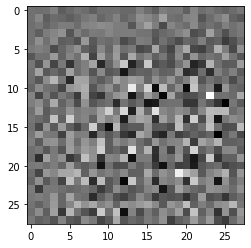

In [ ]:
noise = tf.random.normal([1,100])
plt.imshow(gan(noise, training=False)[0,:,:,0], cmap='gray')

In [ ]:
class CustomCallback(keras.callbacks.Callback):
  def __init__(self, print_every_batch):
    self.print_every_batch = print_every_batch
    self.epoch_num = 0;

  def on_epoch_begin(self, epoch, logs=None):
    self.epoch_num += 1

  def on_train_batch_begin(self, batch, logs=None):
    
    if batch % self.print_every_batch == 0:
      fig = plt.figure(figsize=(10,10))

      for i in range(9):
        plt.subplot(3,3,i+1)
        noise = tf.random.normal([1,100])
        plt.imshow(self.model(noise, training=False)[0,:,:,0]*127.5 + 127.5, cmap='gray')
        plt.axis('off')
      plt.savefig(f"/content/drive/MyDrive/Digit GAN images/image_at_epoch_{self.epoch_num}__batch_{batch}.png")
      plt.show()

In [ ]:
gan.fit(dataset, epochs=30, callbacks=[CustomCallback(200)])

In [ ]:
gan.save_weights('/content/drive/MyDrive/DigitGAN')

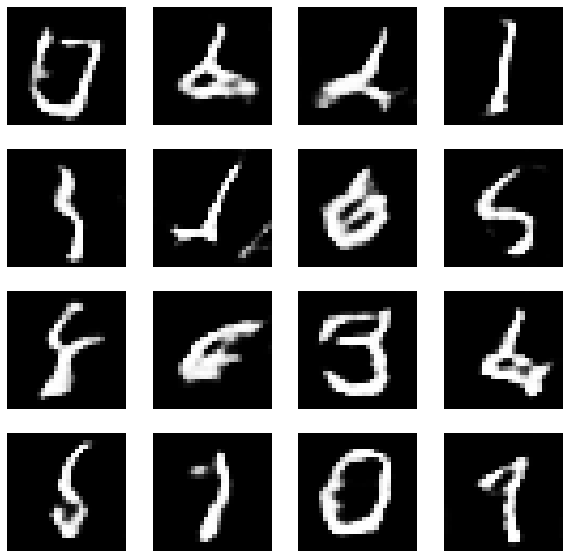

In [ ]:
plt.figure(figsize=(10,10))

for i in range(16):
  ax = plt.subplot(4,4,i+1)
  noise = tf.random.normal([1,100])
  plt.imshow(gan(noise, training=False)[0,:,:,0]*127.5 + 127.5, cmap='gray')
  plt.axis('off')

In [ ]:
anim_file = 'DigitGAN.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob('/content/drive/MyDrive/Digit GAN images/*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)


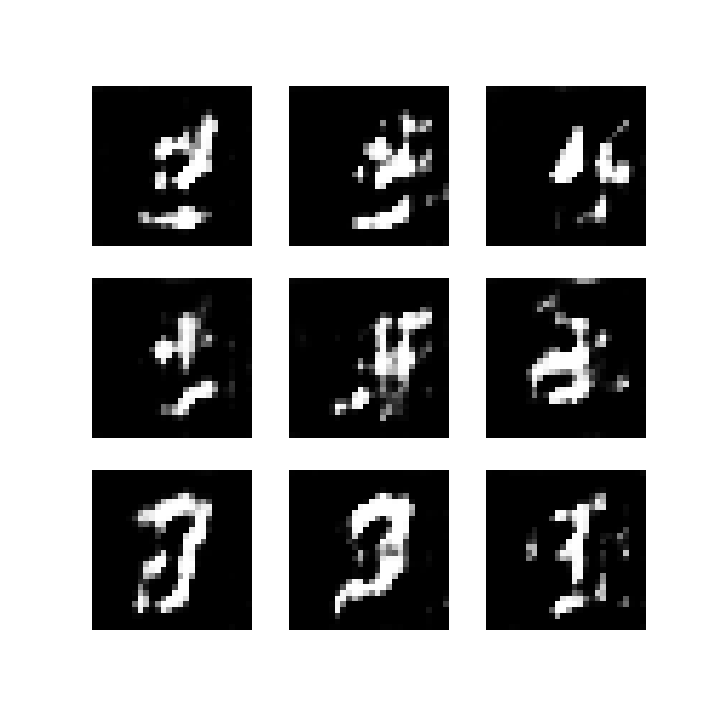

In [ ]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

## Training GAN for Celebrity Dataset

In [ ]:
os.environ['KAGGLE_CONFIG_DIR'] = "/content/drive/MyDrive/celebA dataset smaller"

In [ ]:
%cd /content/drive/MyDrive/celebA dataset smaller

/content/drive/MyDrive/celebA dataset smaller


In [ ]:
%pwd

'/content/drive/MyDrive/celebA dataset smaller'

In [ ]:
!ls

kaggle.json


In [ ]:
!kaggle datasets download -d greg115/celebrities-100k

401 - Unauthorized


In [ ]:
!ls

In [ ]:
!unzip \*.zip && rm *.zip

In [ ]:
with open('/content/drive/MyDrive/testing_saving/file.txt', 'w') as filehandle:
  filehandle.writelines("%s\n" % path for path in image_paths)

In [ ]:
image_paths = []
with open('/content/drive/MyDrive/testing_saving/file.txt','r') as filehandle:
  filecontents = filehandle.readlines()

  for line in filecontents:
    current_place = line[:-1]
    image_paths.append(current_place)

In [ ]:
image_paths[:10]

['/content/drive/MyDrive/Kaggle/img_align_celeba/img_align_celeba/054966.jpg',
 '/content/drive/MyDrive/Kaggle/img_align_celeba/img_align_celeba/055179.jpg',
 '/content/drive/MyDrive/Kaggle/img_align_celeba/img_align_celeba/054805.jpg',
 '/content/drive/MyDrive/Kaggle/img_align_celeba/img_align_celeba/055108.jpg',
 '/content/drive/MyDrive/Kaggle/img_align_celeba/img_align_celeba/055014.jpg',
 '/content/drive/MyDrive/Kaggle/img_align_celeba/img_align_celeba/055323.jpg',
 '/content/drive/MyDrive/Kaggle/img_align_celeba/img_align_celeba/055053.jpg',
 '/content/drive/MyDrive/Kaggle/img_align_celeba/img_align_celeba/054961.jpg',
 '/content/drive/MyDrive/Kaggle/img_align_celeba/img_align_celeba/054772.jpg',
 '/content/drive/MyDrive/Kaggle/img_align_celeba/img_align_celeba/055336.jpg']

In [ ]:
model = MTCNN()

def extract_faces(pixels, required_size=(), model=model):
  faces = model.detect_faces(pixels)
  
  if len(faces) == 0:
    return None

  x1, y1, width, height = faces[0]['box']
  x1, y1 = abs(x1),abs(y1)
  x2, y2 = x1 + width, y1 + height

  face_pixels = pixels[y1:y2, x1:x2]
  image = Image.fromarray(face_pixels)
  image = image.resize(required_size)
  #face_array = asarray(image)
  return image

In [ ]:
def read_img(path):
  img = Image.open(path)
  img = img.convert('RGB')
  pixels = asarray(img)

  return extract_faces(pixels=pixels, required_size=(64,64))

In [ ]:
img_num = 0
for path in image_paths[45000:50000]:
  test_img = read_img(path)
  
  if test_img == None:
    continue
  
  img_num += 1
  if img_num % 100 == 0:
    print(f"Status update {img_num} images done -----")

  test_img.save(f"/content/drive/MyDrive/celebA/{os.path.basename(path)}")
  del test_img

In [ ]:
test_img.save('/content/drive/MyDrive/celebA dataset smaller/img.png')

In [ ]:
def get_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return tf.image.resize(img, [64,64])

(-0.5, 63.5, 63.5, -0.5)

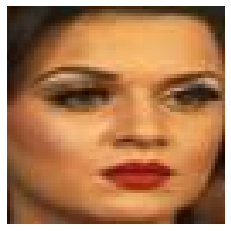

In [ ]:
test_img = get_img("/content/drive/MyDrive/celebA/005346.jpg")

plt.imshow(test_img.numpy().astype('uint8'))
plt.axis('off')

In [ ]:
image_paths = glob('/content/drive/MyDrive/celebA/*')

len(image_paths)

49827

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices(image_paths[:49000])
dataset.element_spec

TensorSpec(shape=(), dtype=tf.string, name=None)

In [ ]:
dataset = dataset.map(get_img)

In [ ]:
normalization_layer = layers.experimental.preprocessing.Rescaling(1./127.5, -1)
dataset = dataset.map(normalization_layer)

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

def configure_for_performance(ds):
  ds = ds.cache()
  ds = ds.batch(128)
  ds = ds.prefetch(buffer_size=AUTOTUNE)
  return ds

In [ ]:
dataset = configure_for_performance(dataset)

In [ ]:
dataset.element_spec

TensorSpec(shape=(None, 64, 64, 3), dtype=tf.float32, name=None)

In [ ]:
generator = tf.keras.Sequential([
             layers.Dense(2*2*1024, input_shape=(100,)),
             layers.BatchNormalization(),
             layers.LeakyReLU(),
             layers.Reshape((2,2,1024)),

             layers.Conv2DTranspose(512, 4, strides=2, padding='same'),
             layers.BatchNormalization(),
             layers.LeakyReLU(),

             layers.Conv2DTranspose(256, 4, strides=2, padding='same'),
             layers.BatchNormalization(),
             layers.LeakyReLU(),
             
             layers.Conv2DTranspose(128, 4, strides=2, padding='same'),
             layers.BatchNormalization(),
             layers.LeakyReLU(),
             
             layers.Conv2DTranspose(64, 4, strides=2, padding='same'),
             layers.BatchNormalization(),
             layers.LeakyReLU(),
            
             layers.Conv2DTranspose(3, 4, strides=2, padding='same'),
             layers.Activation('tanh')
])

generator.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2 (Dense)              (None, 4096)              413696    
_________________________________________________________________
batch_normalization_4 (Batch (None, 4096)              16384     
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 4096)              0         
_________________________________________________________________
reshape_1 (Reshape)          (None, 2, 2, 1024)        0         
_________________________________________________________________
conv2d_transpose_4 (Conv2DTr (None, 4, 4, 512)         8389120   
_________________________________________________________________
batch_normalization_5 (Batch (None, 4, 4, 512)         2048      
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 4, 4, 512)        

In [ ]:
discriminator = tf.keras.Sequential([
          layers.Conv2D(32,4,input_shape=(64,64,3)),
          layers.LeakyReLU(),

          layers.Conv2D(64,4,strides=2,padding='same'),
          layers.Dropout(0.3),
          layers.LeakyReLU(),
    
          layers.Conv2D(128,4,strides=2,padding='same'),
          layers.Dropout(0.3),
          layers.LeakyReLU(),

          layers.Conv2D(256,4,strides=2,padding='same'),
          layers.LeakyReLU(),
          layers.Flatten(),
          layers.Dropout(0.3),
          layers.Dense(1),
])

discriminator.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 61, 61, 32)        1568      
_________________________________________________________________
leaky_re_lu_11 (LeakyReLU)   (None, 61, 61, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 31, 31, 64)        32832     
_________________________________________________________________
dropout_2 (Dropout)          (None, 31, 31, 64)        0         
_________________________________________________________________
leaky_re_lu_12 (LeakyReLU)   (None, 31, 31, 64)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 16, 16, 128)       131200    
_________________________________________________________________
dropout_3 (Dropout)          (None, 16, 16, 128)      

In [ ]:
dcgan = GAN(generator, discriminator,100,add_noise=True,label_smoothing=True)
dcgan.compile(
    tf.keras.optimizers.Adam(0.0002, beta_1=0.5, beta_2=0.999),
    tf.keras.optimizers.Adam(0.0002, beta_1=0.5, beta_2=0.999),
    tf.keras.losses.BinaryCrossentropy(from_logits=True),
)

(-0.5, 63.5, 63.5, -0.5)

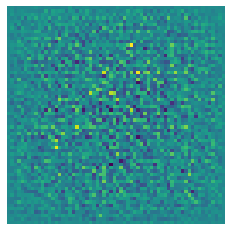

In [ ]:
noise = tf.random.normal([1,100])
plt.imshow(dcgan(noise, training=False)[0,:,:,0]*127.5 + 127.5)
plt.axis('off')

In [ ]:
class CustomCallback(keras.callbacks.Callback):
  def __init__(self, print_every_batch, latent_dim=100):
    self.print_every_batch = print_every_batch
    self.epoch_num = 0;
    self.latent_dim = latent_dim

  def on_epoch_begin(self, epoch, logs=None):
    self.epoch_num += 1

  def on_train_batch_begin(self, batch, logs=None):
    
    if batch % self.print_every_batch == 0:
      fig = plt.figure(figsize=(10,10))

      for i in range(9):
        plt.subplot(3,3,i+1)
        noise = tf.random.normal([1,self.latent_dim])
        plt.imshow(self.model(noise, training=False)[0,:,:,0]*127.5 + 127.5)
        plt.axis('off')
      plt.savefig(f"image_at_epoch_{self.epoch_num}__batch_{batch}__for_face_generation.png")
      plt.show()

In [ ]:
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath = '/content/drive/MyDrive/testing_saving',
    save_weights_only=True
)

In [ ]:
history = dcgan.fit(dataset, epochs=20, initial_epoch=13, callbacks=[model_checkpoint_callback, CustomCallback(10,100)]) 

In [ ]:
dcgan.load_weights('/content/drive/MyDrive/testing_saving')

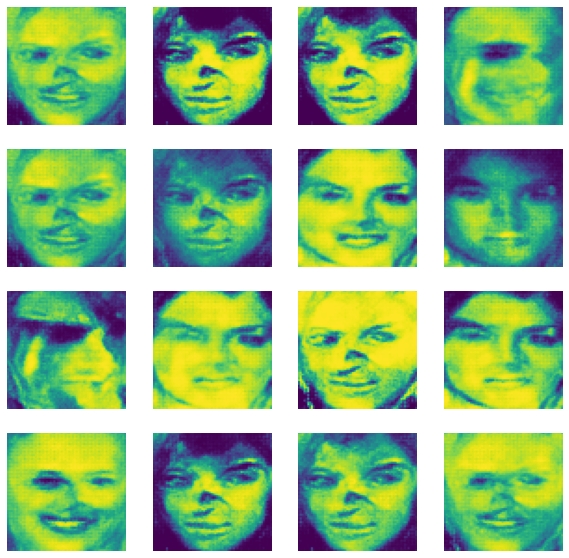

In [ ]:
plt.figure(figsize=(10,10))

for i in range(16):
  ax = plt.subplot(4,4,i+1)
  noise = tf.random.normal([1,100])   
  plt.imshow((dcgan(noise, training=False)[0,:,:,0]*127.5 + 127.5).numpy().astype('uint8'))
  plt.axis('off')